In [2]:
import sys
from src import PATH
from src import _diffplot as dfp

import scvelo as scv
import scanpy as sc
import cellrank as cr
import numpy as np
import pandas as pd

scv.settings.verbosity = 3
scv.settings.set_figure_params("scvelo")
cr.settings.verbosity = 2

import warnings

warnings.simplefilter("ignore", category=UserWarning)
warnings.simplefilter("ignore", category=FutureWarning)
warnings.simplefilter("ignore", category=DeprecationWarning)

/home/wergillius/Project/diffuse_differentiate/script/path_n_util.py
/home/wergillius/Project/diffuse_differentiate/machine_config.json


In [3]:
import matplotlib.pyplot as plt
from src._configure import Yaml_configurer
from script.main_train_with_PL_trainer import dl_from_config, get_model_from_config, get_sampler_from_configs

In [4]:
# load adata
adata_GD = sc.read_h5ad("GenDiff_inferred_dynamics.h5ad")

TF, counts = np.unique(adata_GD.obs.TF.values, return_counts=True)
proportion = counts/adata_GD.shape[0]
TF_exposure_lookup = dict(zip(TF,counts))

# condition
adata_GD.obs['condition'] = adata_GD.obs['TF'].values
adata_GD.obs['condition_counts'] = adata_GD.obs['TF'].map(TF_exposure_lookup)

# **Cell rank**

In [5]:
from cellrank.tl import kernels

In [6]:
class MyKernel(cr.tl.kernels.Kernel):
    def compute_transition_matrix(self, some_parameter: float = 0.5) -> "MyKernel":
        transition_matrix = self.adata.uns['velocity_graph']
        self._compute_transition_matrix(transition_matrix, density_normalize=True)
        return self

    def copy(self) -> "MyKernel":
        return copy(self)

In [7]:
k = MyKernel(adata_GD).compute_transition_matrix()
k.transition_matrix.A

array([[1., 0., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 0., 1.]])

In [8]:
vk = kernels.VelocityKernel(adata_GD, xkey='X').compute_transition_matrix()
adata_GD.obsp['velo_kernel_transition'] = vk.transition_matrix

Computing transition matrix based on logits using `'deterministic'` mode
Estimating `softmax_scale` using `'deterministic'` mode


  0%|          | 0/28825 [00:00<?, ?cell/s]

Setting `softmax_scale=1.7188`


  0%|          | 0/28825 [00:00<?, ?cell/s]

    Finish (0:03:13)


The 'monte_carlo` mode will take a days to run

``` python
vk_mc = kernels.VelocityKernel(adata,xkey='X').compute_transition_matrix(mode='monte_carlo')

```

In [9]:
ck = kernels.ConnectivityKernel(adata_GD).compute_transition_matrix()

Computing transition matrix based on `adata.obsp['connectivities']`


    Finish (0:00:00)


In [10]:
pk = kernels.PseudotimeKernel(adata_GD).compute_transition_matrix()

Computing transition matrix based on `dpt_pseudotime`


  0%|          | 0/28825 [00:00<?, ?cell/s]

    Finish (0:00:12)


In [11]:
combined_kernel = 0.8 * vk + 0.1 * ck + 0.1 * pk

In [12]:
from cellrank.tl.estimators import GPCCA

g = GPCCA(combined_kernel)
print(g)

GPCCA[n=28825, kernel=((0.8 * <VelocityKernel[softmax_scale=1.72, mode=deterministic, seed=15056, scheme=<CorrelationScheme>]>) + (0.1 * <ConnectivityKernel[dnorm=True, key=connectivities]>) + (0.1 * <PseudotimeKernel[dnorm=False, scheme=hard, frac_to_keep=0.3]>))]


Computing Schur decomposition


Adding `adata.uns['eigendecomposition_fwd']`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:06)


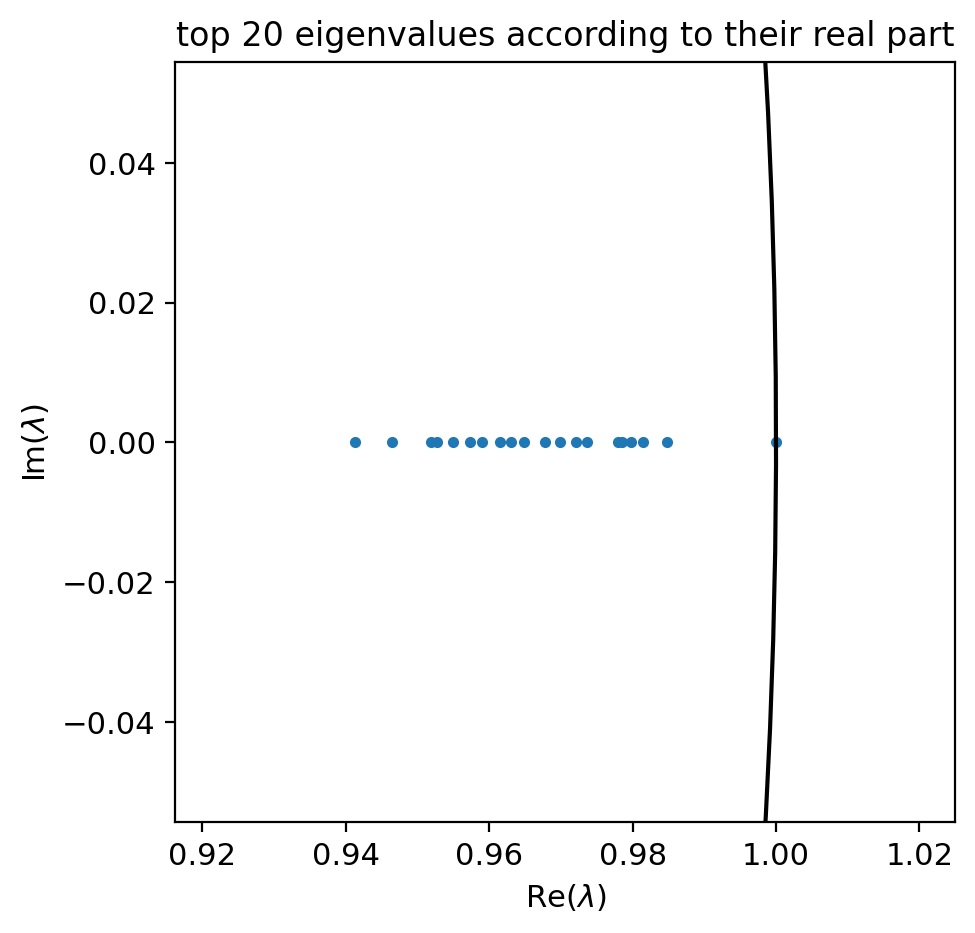

In [13]:
g.compute_schur(n_components=20)
g.plot_spectrum()

In [14]:
g.compute_macrostates(n_states=9, cluster_key="louvain")

Computing `9` macrostates
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:30)


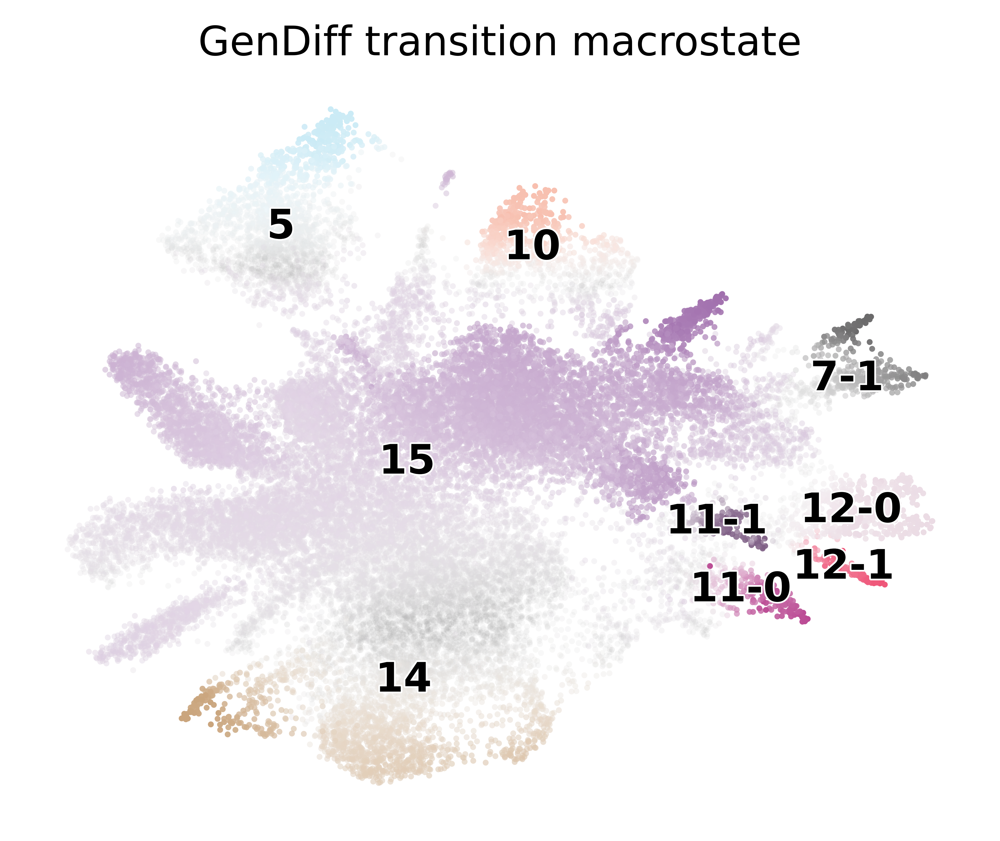

In [15]:
g.plot_macrostates(dpi=600, figsize=(5,4),
     title='GenDiff transition macrostate')

/home/wergillius/.conda/envs/GenDiff/lib/python3.8/site-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


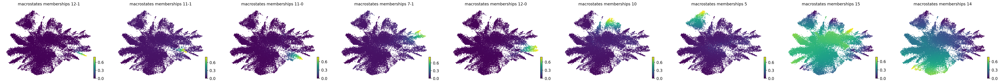

In [16]:
g.plot_macrostates(same_plot=False)

In [17]:
g.compute_terminal_states()

Adding `adata.obs['terminal_states']`
       `adata.obs['terminal_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


In [18]:
g.compute_absorption_probabilities(use_petsc=True, solver='gmres')

Computing absorption probabilities


  0%|          | 0/9 [00:00<?, ?/s]

Adding `adata.obsm['to_terminal_states']`
       `.absorption_probabilities`
    Finish (0:00:01)


In [19]:
for i, n in enumerate(g.absorption_probabilities.names):
    adata_GD.obs[f'member_{n}_absorption'] = g.absorption_probabilities.X[:,i]

In [23]:
adata_GD.obs.to_csv("cellrank_GenDiff_abs_p.csv", index=True)

# **Analysis of member 5**

In [18]:
import seaborn as sns

In [100]:
def rank_TF_by_absortion_p(adata, member_col="member_7-1_absorption", n_condition = 15,condition_count_cutoff=20):

    # compute mean and median
    abs_df = adata.obs.copy()
    sumdf= abs_df.groupby('TF').agg({member_col:["mean",'median']})
    sumdf.columns = ['mean', 'median']
    sumdf['mean_median'] = sumdf[['mean', 'median']].sum(axis=1)
    # 
    sumdf = sumdf.sort_values('mean_median',ascending=False)
    sumdf['condition_counts'] = [TF_exposure_lookup[TF] for TF in sumdf.index]
    # abs_mean_map = sumdf.to_dict()['mean']
    abs_median_map = sumdf.to_dict()['median']
    abs_map = sumdf.to_dict()['mean_median']

    # absortion
    abs_df['abs_mean_median'] = abs_df['TF'].map(abs_map)
    # abs_df['abs_median'] = abs_df['TF'].map(abs_median_map)
    abs_df = abs_df.sort_values(by='abs_mean_median', ascending=False)

    # select
    TFs = list(sumdf.query("`condition_counts` > @condition_count_cutoff").index)[:n_condition]
    # sort TFs

    return TFs

In [119]:
list(adata_GD.obs.highlight_celltype.unique())

['squamous epithelial',
 'ciliated epithelial',
 'bronchiolar and alveolar epithelial',
 'intestinal epithelial',
 'PAEP_MECOM+ epithelial',
 'smooth muscle',
 'others',
 'ureteric bud',
 'metanephric',
 'ENS neurons',
 'stromal',
 'syncytio and villous cyto trophoblasts',
 'vascular endothelial']

Text(0.5, 0, '')

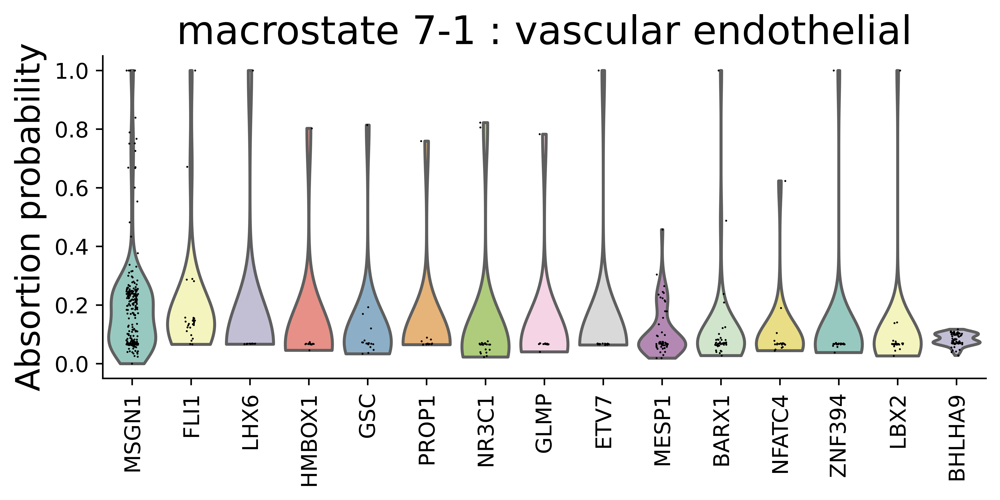

In [146]:
ms = "7-1"
cell_type = 'vascular endothelial'

member_col=f"member_{ms}_absorption"
TFs = rank_TF_by_absortion_p(adata_GD, member_col, n_condition = 15, 
            condition_count_cutoff=10)

fig, ax = plt.subplots(1,1,figsize=(8,3), dpi=600)
sc.pl.violin(adata_GD[adata_GD.obs.TF.isin(TFs)], 
            # adata_GD, 
            order = TFs,
            palette='Set3',
            keys= member_col, ax= ax, show=False,
             groupby='condition', saturation=0.7,
            )
ax.set_ylabel("Absortion probability", fontsize=17)
ax.set_title(f"macrostate {ms} : {cell_type}", fontsize=20)
sns.despine(ax=ax)
ax.set_xticklabels(
    [tf.split("-")[1] for tf in TFs], rotation=90)
ax.set_xlabel("")

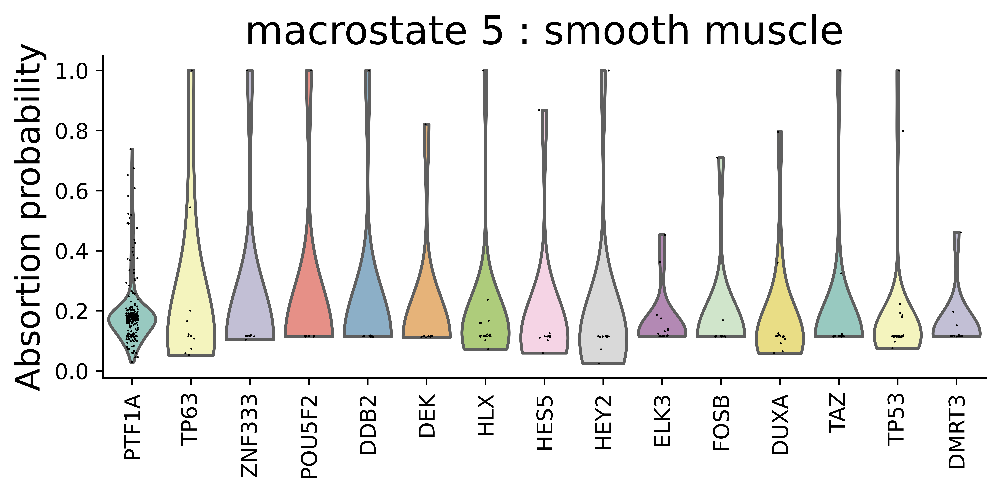

In [148]:
ms = "5"
cell_type = 'smooth muscle'

member_col=f"member_{ms}_absorption"
TFs = rank_TF_by_absortion_p(adata_GD, member_col, n_condition = 15, 
            condition_count_cutoff=10)

fig, ax = plt.subplots(1,1,figsize=(8,3), dpi=600)
sc.pl.violin(adata_GD[adata_GD.obs.TF.isin(TFs)], 
            # adata_GD, 
            order = TFs,
            palette='Set3', saturation=0.7,
            keys= member_col, ax= ax, show=False,
             groupby='condition', 
            )
ax.set_ylabel("Absortion probability", fontsize=17)
ax.set_title(f"macrostate {ms} : {cell_type}", fontsize=20)
ax.set_xticklabels(
            [tf.split("-")[1] for tf in TFs],
             rotation=90)
ax.set_xlabel("")
sns.despine(ax=ax)

In [26]:
g.compute_lineage_drivers("5")

Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:05)


,5_corr,5_pval,5_qval,5_ci_low,5_ci_high
ZNF804A,0.546826,0.000000e+00,0.000000e+00,0.538682,0.554867
KCNE5,0.310557,0.000000e+00,0.000000e+00,0.300089,0.320951
TBX15,0.304531,0.000000e+00,0.000000e+00,0.294020,0.314968
HAPLN1,0.303212,0.000000e+00,0.000000e+00,0.292692,0.313659
HEY1,0.283875,0.000000e+00,0.000000e+00,0.273226,0.294455
...,...,...,...,...,...
SPATA16,-0.100220,2.407127e-65,1.652665e-63,-0.111636,-0.088779
LOC102724210,-0.101381,7.793359e-67,5.428244e-65,-0.112794,-0.089942
LOC101927973,-0.115499,2.324871e-86,1.893785e-84,-0.126874,-0.104093
LOC284825,-0.122771,1.931843e-97,1.894783e-95,-0.134125,-0.111385


NameError: name 'adata' is not defined

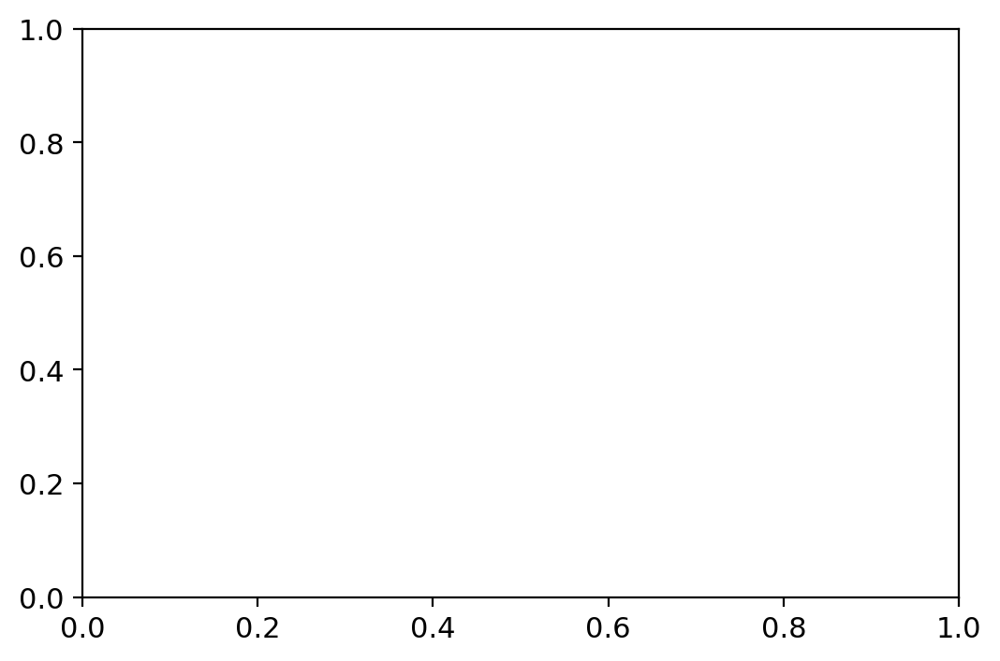

In [27]:
fig, ax = plt.subplots(1,1)
sc.pl.umap(adata, color = ['member_5_absorption'], 
           ax=ax, frameon = False, return_fig=False)


# **Analysis of member 7**

In [47]:
import matplotlib.pyplot as plt

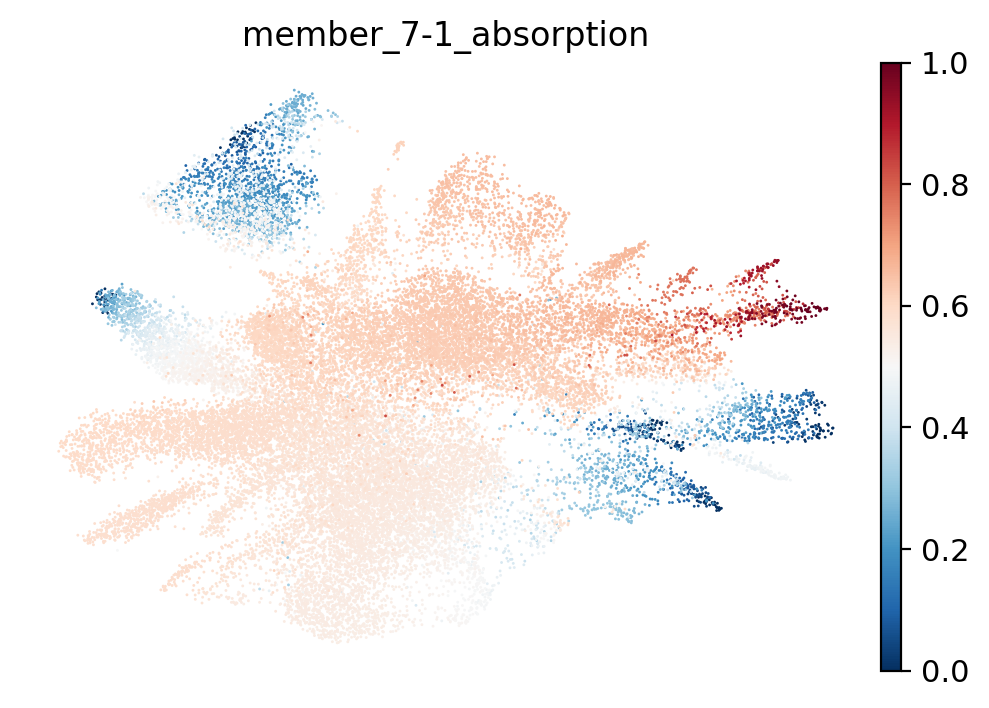

In [69]:
fig, ax = plt.subplots(1,1)
sc.pl.umap(adata, color = ['member_7-1_absorption'], 
           ax=ax, frameon = False, return_fig=False)


In [70]:
g.compute_lineage_drivers("7-1")

Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:05)


,7-1_corr,7-1_pval,7-1_qval,7-1_ci_low,7-1_ci_high
COL3A1,0.213381,2.556018e-296,7.677639e-294,0.202335,0.224373
GREB1L,0.205414,3.921450e-274,1.047027e-271,0.194331,0.216445
ADGRL4,0.162098,1.169667e-169,1.561506e-167,0.150836,0.173318
CDH6,0.154316,1.071900e-153,1.320910e-151,0.143027,0.165565
DACH1,0.137057,2.965917e-121,2.336754e-119,0.125712,0.148366
...,...,...,...,...,...
LOC101927973,-0.280442,0.000000e+00,0.000000e+00,-0.291044,-0.269771
LINC00458,-0.288472,0.000000e+00,0.000000e+00,-0.299021,-0.277853
NTS,-0.290161,0.000000e+00,0.000000e+00,-0.300698,-0.279553
LOC284825,-0.297628,0.000000e+00,0.000000e+00,-0.308113,-0.287070


/home/wergillius/.conda/envs/GenDiff/lib/python3.8/site-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


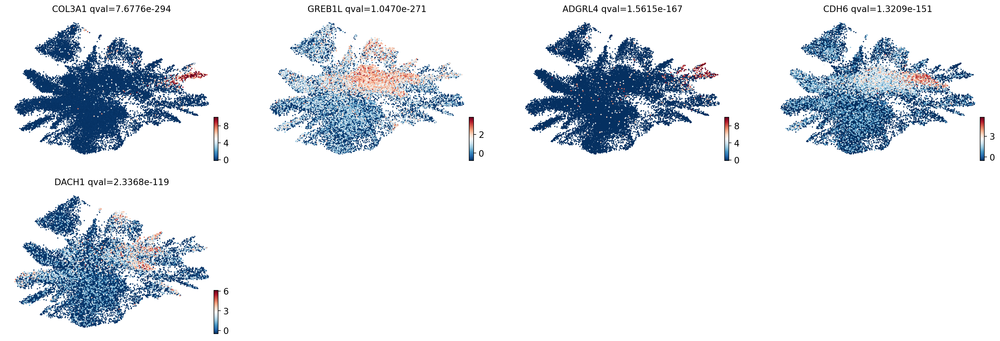

In [71]:
g.plot_lineage_drivers("7-1", n_genes=5)

Solving TSP for `6` states


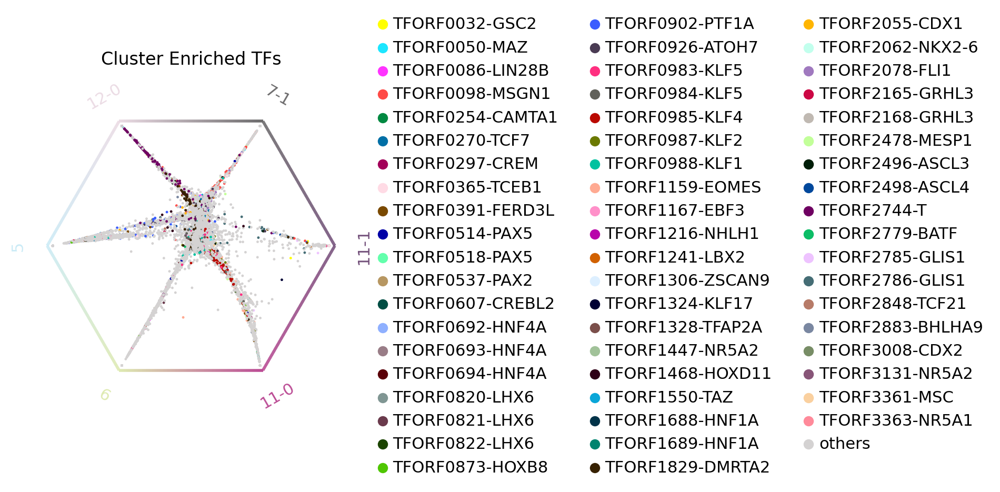

In [72]:
cr.pl.circular_projection(adata, keys="Cluster Enriched TFs", legend_loc="right")

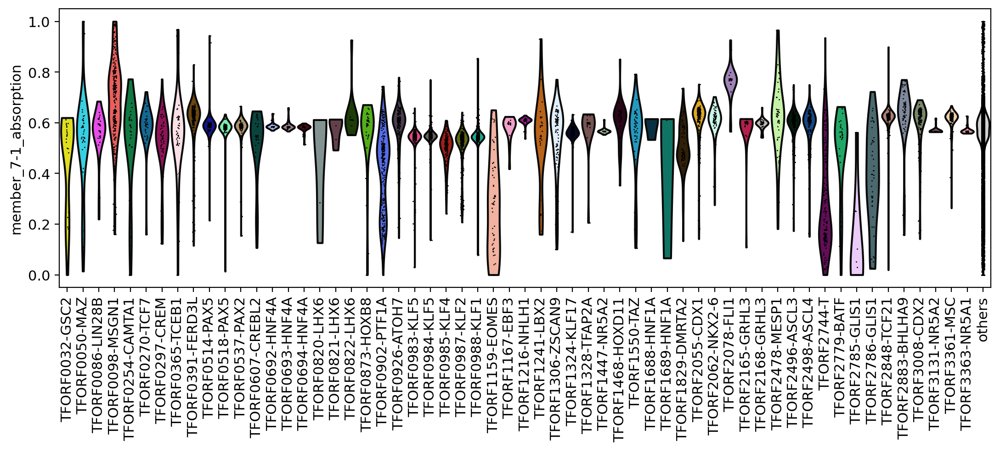

In [84]:
fig, ax = plt.subplots(1,1, figsize=(13,4))
sc.pl.violin(adata, keys='member_7-1_absorption',
             groupby='Cluster Enriched TFs',
             ax=ax, return_fig=False, rotation=90
            )

# some driver genes

In [198]:
alpha_drivers = g.compute_lineage_drivers(lineages="7", return_drivers=True)
alpha_drivers.sort_values(by="7_corr", ascending=False)

Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:14)


,7_corr,7_pval,7_qval,7_ci_low,7_ci_high
COL3A1,0.260075,0.000000e+00,0.000000e+00,0.249279,0.270806
ADGRL4,0.212673,2.615438e-294,1.142709e-291,0.201624,0.223668
AFF3,0.172753,7.041743e-193,1.880145e-190,0.161530,0.183930
MEF2C,0.168460,2.471583e-183,5.656395e-181,0.157222,0.179655
DLC1,0.167310,8.069199e-181,1.762753e-178,0.156067,0.178510
...,...,...,...,...,...
SNAI2,-0.240357,0.000000e+00,0.000000e+00,-0.251205,-0.229450
ZNF804A,-0.254155,0.000000e+00,0.000000e+00,-0.264922,-0.243325
HAPLN1,-0.308507,0.000000e+00,0.000000e+00,-0.318915,-0.298024
TBX15,-0.320628,0.000000e+00,0.000000e+00,-0.330947,-0.310232


In [213]:
np.intersect1d(g.lineage_drivers.index, ["NR2F2", "EPHB4", "NRP2", "APLNR"])

array(['APLNR', 'NR2F2', 'NRP2'], dtype=object)

In [218]:
np.intersect1d(g.lineage_drivers.index, ["GATA2", "RUNX1"])

array(['GATA2', 'RUNX1'], dtype=object)

In [216]:
np.intersect1d(g.lineage_drivers.index, ["SOX17", "GJA5", "EFNB2", "DLL4", "HEY1", "HEY2", "HES4"])

array(['EFNB2', 'HEY1'], dtype=object)

In [219]:
g.lineage_drivers.loc[["GATA2", "RUNX1"]]

,7_corr,7_pval,7_qval,7_ci_low,7_ci_high
GATA2,-0.005879,3.182524e-01,4.824630e-01,-0.017422,0.005666
RUNX1,0.038101,9.699434e-11,8.812000e-10,0.026568,0.049623


In [215]:
g.lineage_drivers.loc[['APLNR', 'NR2F2', 'NRP2']]

,7_corr,7_pval,7_qval,7_ci_low,7_ci_high
APLNR,0.083512,7.837283e-46,2.875266e-44,0.072037,0.094965
NR2F2,0.080640,7.703461e-43,2.553299e-41,0.069160,0.092098
NRP2,0.037889,1.230251e-10,1.109303e-09,0.026356,0.049412


In [217]:
g.lineage_drivers.loc[['EFNB2', 'HEY1']]

,7_corr,7_pval,7_qval,7_ci_low,7_ci_high
EFNB2,0.049088,7.406971e-17,1.019997e-15,0.037565,0.060598
HEY1,-0.119668,1.256100e-92,1.207364e-90,-0.131032,-0.108274


# <font size=5 color='navy'>**result saved here**

In [ ]:
# if can not save
# adata.obsm.pop['terminal_state']
# adata.obsm.pop['to_terminal_state']

In [46]:
adata.write_h5ad(
    os.path.join(PATH.main_dir, "data/TFAtlas/diff_cellrank_result.h5ad")
    )

# others

In [57]:
# index, remove batch label 
cell_type = pd.read_table(os.path.join(PATH.main_dir, "data/TFAtlas/knn_pred.txt"))
cbindex=cell_type.CB.apply(lambda x:x.replace("-TF_atlas",""))

# remove organ 
pred = cell_type['cell type'].apply(lambda x: x.split("-")[1]).values
adata_TF.obs.loc[cbindex, 'cell_type'] = pred

In [ ]:
from sklearn.metrics.pairwise import cosine_distances

distances = 1 - cosine_distances(
    adata_merged[adata_merged.obs['sample'] == "pbmc3k"].obsm["Scanorama"],
    adata_merged[adata_merged.obs['sample'] == "ctrl"].obsm["Scanorama"],
)

In [ ]:
def label_transfer(dist, labels, index):
    lab = pd.get_dummies(labels)
    class_prob = lab.to_numpy().T @ dist
    norm = np.linalg.norm(class_prob, 2, axis=0)
    class_prob = class_prob / norm
    class_prob = (class_prob.T - class_prob.min(1)) / class_prob.ptp(1)
    # convert to df
    cp_df = pd.DataFrame(
        class_prob, columns=lab.columns
    )
    cp_df.index = index
    # classify as max score
    m = cp_df.idxmax(axis=1)
    
    return m